In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline
from sklearn import metrics
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
import warnings
from ydata_profiling import ProfileReport
from sklearn.model_selection import KFold, GridSearchCV
from sklearn.preprocessing import StandardScaler
from sklearn.svm import LinearSVR
from sklearn.svm import SVR
from sklearn.pipeline import Pipeline
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error

warnings.filterwarnings("ignore")
# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/opt/conda/lib/python3.10/site-packages/numba/core/decorators.py:262: NumbaDeprecationWarning: numba.generated_jit is deprecated. Please see the documentation at: https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-generated-jit for more information and advice on a suitable replacement.
  warnings.warn(msg, NumbaDeprecationWarning)
/opt/conda/lib/python3.10/site-packages/visions/backends/shared/nan_handling.py:51: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  def hasna(x: np.ndarray) -> bool:


/kaggle/input/daily-climate-time-series-data/DailyDelhiClimateTrain.csv
/kaggle/input/daily-climate-time-series-data/DailyDelhiClimateTest.csv
/kaggle/input/boston-house-prices/housing.csv


# **Ivan Bashtovyi**
#  lab 2 


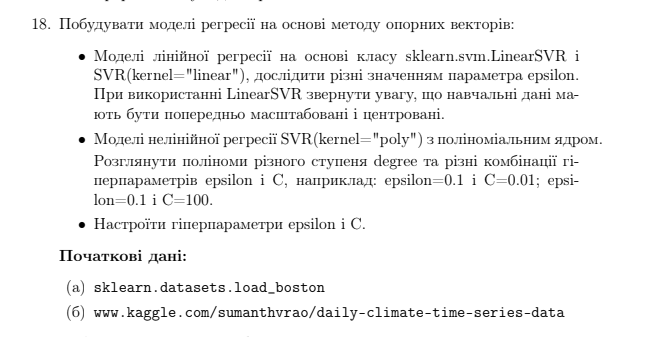

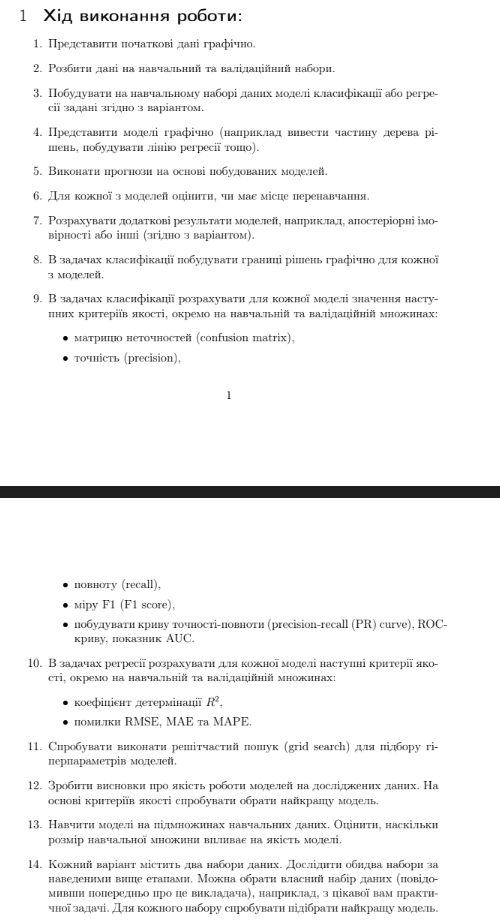

# **Boston house price**

# **Data Understanding**

In [2]:
column_names=['CRIM', 'ZN', 'INDUS', 'CHAS', 'NOX', 'RM', 'AGE', 'DIS', 'RAD', 'TAX', 'PTRATIO', 'B', 'LSTAT', 'MEDV']
data= pd.read_csv('/kaggle/input/boston-house-prices/housing.csv',header=None, delimiter=r'\s+', names=column_names)
data.head()

,CRIM,ZN,INDUS,CHAS,NOX,RM,AGE,DIS,RAD,TAX,PTRATIO,B,LSTAT,MEDV
0,0.00632,18.0,2.31,0,0.538,6.575,65.2,4.0900,1,296.0,15.3,396.90,4.98,24.0
1,0.02731,0.0,7.07,0,0.469,6.421,78.9,4.9671,2,242.0,17.8,396.90,9.14,21.6
2,0.02729,0.0,7.07,0,0.469,7.185,61.1,4.9671,2,242.0,17.8,392.83,4.03,34.7
3,0.03237,0.0,2.18,0,0.458,6.998,45.8,6.0622,3,222.0,18.7,394.63,2.94,33.4
4,0.06905,0.0,2.18,0,0.458,7.147,54.2,6.0622,3,222.0,18.7,396.90,5.33,36.2


Features

CRIM: per capita crime rate by town

ZN: This feature represents the proportion of residential land zoned for lots over 25,000 sq.ft. It indicates the amount of land in each town that is designated for large residential lots.

INDUS: INDUS represents the proportion of non-retail business acres per town. It indicates the amount of land devoted to non-retail businesses, such as manufacturing or industrial activities, in each town.

CHAS: CHAS is a dummy variable that represents whether a town borders the Charles River or not. It takes a value of 1 if the town does border the river, and 0 otherwise.

NOX: NOX represents the concentration of nitric oxides (air pollution) in parts per 10 million. It measures the level of air pollution in each town.

RM: RM stands for average number of rooms per dwelling. It represents the average number of rooms in houses or apartments in each town.

AGE: AGE represents the proportion of owner-occupied units that were built prior to 1940. It indicates the age of the housing stock in each town, with higher values indicating a higher proportion of older homes.

DIS: DIS stands for weighted distances to five Boston employment centers. It represents the average distance from each town to five major employment centers in Boston, with lower values indicating closer proximity.

RAD: RAD is an index of accessibility to radial highways. It measures the accessibility of each town to radial highways, with higher values indicating better accessibility.

TAX: TAX represents the full-value property-tax rate per $10,000. It indicates the property tax rate for each town, with higher values indicating higher tax rates.

PTRATIO: PTRATIO represents the pupil-teacher ratio by town. It reflects the average number of students per teacher in the town's public schools.

B: Bk is the proportion of blacks by town

LSTAT: percent lower status of the population

(TARGET) MEDV: MEDV represents the median value of owner-occupied homes in $1000s. It indicates the median price of homes in each town, which is a commonly used measure of housing market values.

In [3]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 506 entries, 0 to 505
Data columns (total 14 columns):
 #   Column   Non-Null Count  Dtype  
---  ------   --------------  -----  
 0   CRIM     506 non-null    float64
 1   ZN       506 non-null    float64
 2   INDUS    506 non-null    float64
 3   CHAS     506 non-null    int64  
 4   NOX      506 non-null    float64
 5   RM       506 non-null    float64
 6   AGE      506 non-null    float64
 7   DIS      506 non-null    float64
 8   RAD      506 non-null    int64  
 9   TAX      506 non-null    float64
 10  PTRATIO  506 non-null    float64
 11  B        506 non-null    float64
 12  LSTAT    506 non-null    float64
 13  MEDV     506 non-null    float64
dtypes: float64(12), int64(2)
memory usage: 55.5 KB


In [4]:
data.shape

(506, 14)

In [5]:
data.duplicated().sum()

0

In [6]:
data.describe()

,CRIM,ZN,INDUS,CHAS,NOX,RM,AGE,DIS,RAD,TAX,PTRATIO,B,LSTAT,MEDV
count,506.000000,506.000000,506.000000,506.000000,506.000000,506.000000,506.000000,506.000000,506.000000,506.000000,506.000000,506.000000,506.000000,506.000000
mean,3.613524,11.363636,11.136779,0.069170,0.554695,6.284634,68.574901,3.795043,9.549407,408.237154,18.455534,356.674032,12.653063,22.532806
std,8.601545,23.322453,6.860353,0.253994,0.115878,0.702617,28.148861,2.105710,8.707259,168.537116,2.164946,91.294864,7.141062,9.197104
min,0.006320,0.000000,0.460000,0.000000,0.385000,3.561000,2.900000,1.129600,1.000000,187.000000,12.600000,0.320000,1.730000,5.000000
25%,0.082045,0.000000,5.190000,0.000000,0.449000,5.885500,45.025000,2.100175,4.000000,279.000000,17.400000,375.377500,6.950000,17.025000
50%,0.256510,0.000000,9.690000,0.000000,0.538000,6.208500,77.500000,3.207450,5.000000,330.000000,19.050000,391.440000,11.360000,21.200000
75%,3.677083,12.500000,18.100000,0.000000,0.624000,6.623500,94.075000,5.188425,24.000000,666.000000,20.200000,396.225000,16.955000,25.000000
max,88.976200,100.000000,27.740000,1.000000,0.871000,8.780000,100.000000,12.126500,24.000000,711.000000,22.000000,396.900000,37.970000,50.000000


In [7]:
profile = ProfileReport(data, title="Profiling Report")
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

# **Modeling**

In [8]:
def mean_absolute_percentage_error(y_true, y_pred):
    return np.mean(np.abs((y_true - y_pred) / y_true)) * 100

In [9]:
x = data.drop('MEDV',axis=1)
y = data['MEDV']

In [10]:
x_train, x_test, y_train, y_test = train_test_split(x,y,test_size=0.3,random_state=1)

In [11]:
n_splits = 5
kf = KFold(n_splits=n_splits, shuffle=True, random_state=42)

# **SVR**

In [12]:
pipeline = Pipeline([
    ('scaler', StandardScaler()),
    ('svr', SVR())
])

param_grid = {
    'svr__kernel': ['linear', 'poly'],
    'svr__C': [0.1, 1, 10],
    'svr__epsilon': [0.1, 0.2, 0.5],
    'svr__degree': [2, 3, 4]  
}


In [13]:
grid_search = GridSearchCV(pipeline, param_grid, scoring='neg_mean_squared_error', cv=kf, n_jobs=-1)
grid_search.fit(x_train, y_train)

GridSearchCV(cv=KFold(n_splits=5, random_state=42, shuffle=True),
             estimator=Pipeline(steps=[('scaler', StandardScaler()),
                                       ('svr', SVR())]),
             n_jobs=-1,
             param_grid={'svr__C': [0.1, 1, 10], 'svr__degree': [2, 3, 4],
                         'svr__epsilon': [0.1, 0.2, 0.5],
                         'svr__kernel': ['linear', 'poly']},
             scoring='neg_mean_squared_error')

In [14]:
best_params = grid_search.best_params_
print("Best Hyperparameters:", grid_search.best_params_)
print("Best MSE:", -grid_search.best_score_)

Best Hyperparameters: {'svr__C': 10, 'svr__degree': 3, 'svr__epsilon': 0.1, 'svr__kernel': 'poly'}
Best MSE: 24.350589463938384


In [15]:
best_svr = SVR(kernel=best_params['svr__kernel'], C=best_params['svr__C'], epsilon=best_params['svr__epsilon'])
best_svr.fit(x_train, y_train)

SVR(C=10, kernel='poly')

In [16]:
y_pred_train = best_svr.predict(x_train)
y_pred_test = best_svr.predict(x_test)

In [17]:
print("Train set:")
print("Mean squared error Score: {:.4f}".format(mean_squared_error(y_pred_train, y_train)))
print("R-squared Score: {:.4f}".format(r2_score(y_pred_train, y_train)))
print("Mean Absolute Error : {:.4f}".format(mean_absolute_error(y_pred_train, y_train)))
print("Mean Absolute Percentage Error : {:.4f}%".format(mean_absolute_error(y_pred_train, y_train)))

print()

print("Test set:")
print("Mean squared error Score: {:.4f}".format(mean_squared_error(y_pred_test, y_test)))
print("R-squared Score: {:.4f}".format(r2_score(y_pred_test, y_test)))
print("Mean Absolute Error : {:.4f}".format(mean_absolute_error(y_pred_test, y_test)))
print("Mean Absolute Percentage Error : {:.4f}%".format(mean_absolute_error(y_pred_test, y_test)))

Train set:
Mean squared error Score: 54.2993
R-squared Score: -1.2952
Mean Absolute Error : 4.4536
Mean Absolute Percentage Error : 4.4536%

Test set:
Mean squared error Score: 66.1928
R-squared Score: -1.9511
Mean Absolute Error : 4.9856
Mean Absolute Percentage Error : 4.9856%


# **Results of our model trained on less data**

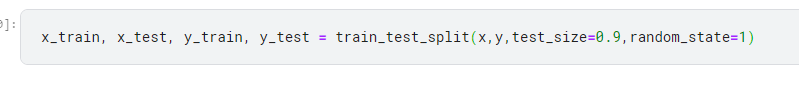

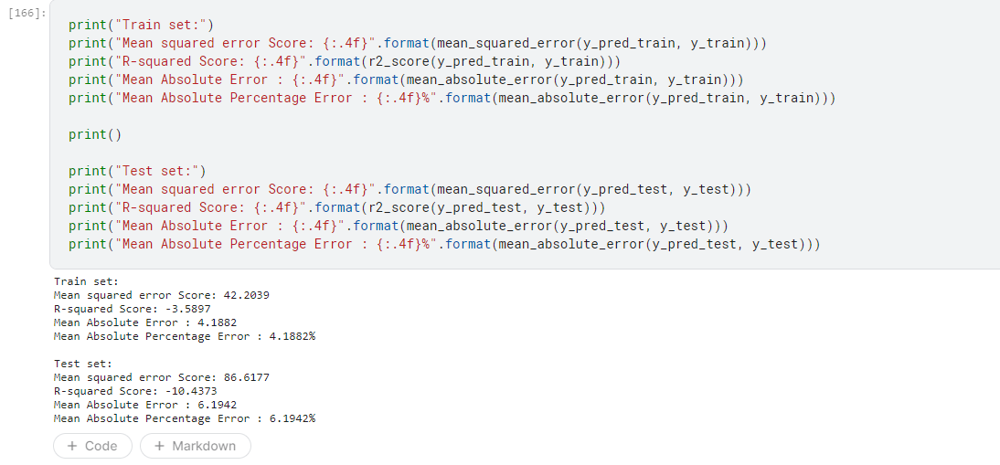

# **LinearSVR**

In [18]:
pipeline = Pipeline([
    ('scaler', StandardScaler()),
    ('svr', LinearSVR(max_iter = 10000))
])

param_grid = {
    'svr__C': [0.01, 0.1, 1.0, 10.0],  
    'svr__epsilon': [0.01, 0.1, 1.0], 

}

In [19]:
grid_search = GridSearchCV(pipeline, param_grid, scoring='neg_mean_squared_error', cv=kf, n_jobs=-1)
grid_search.fit(x_train, y_train)

GridSearchCV(cv=KFold(n_splits=5, random_state=42, shuffle=True),
             estimator=Pipeline(steps=[('scaler', StandardScaler()),
                                       ('svr', LinearSVR(max_iter=10000))]),
             n_jobs=-1,
             param_grid={'svr__C': [0.01, 0.1, 1.0, 10.0],
                         'svr__epsilon': [0.01, 0.1, 1.0]},
             scoring='neg_mean_squared_error')

In [20]:
best_params = grid_search.best_params_
print("Best Hyperparameters:", grid_search.best_params_)
print("Best MSE:", -grid_search.best_score_)

Best Hyperparameters: {'svr__C': 10.0, 'svr__epsilon': 1.0}
Best MSE: 29.050017664318887


In [21]:
best_linear_svr = SVR(C=best_params['svr__C'], epsilon=best_params['svr__epsilon'])
best_linear_svr.fit(x_train, y_train)

SVR(C=10.0, epsilon=1.0)

In [22]:
y_pred_train = best_linear_svr.predict(x_train)
y_pred_test = best_linear_svr.predict(x_test)

In [23]:
print("Train set:")
print("Mean squared error Score: {:.4f}".format(mean_squared_error(y_pred_train, y_train)))
print("R-squared Score: {:.4f}".format(r2_score(y_pred_train, y_train)))
print("Mean Absolute Error : {:.4f}".format(mean_absolute_error(y_pred_train, y_train)))
print("Mean Absolute Percentage Error : {:.4f}%".format(mean_absolute_error(y_pred_train, y_train)))

print()

print("Test set:")
print("Mean squared error Score: {:.4f}".format(mean_squared_error(y_pred_test, y_test)))
print("R-squared Score: {:.4f}".format(r2_score(y_pred_test, y_test)))
print("Mean Absolute Error : {:.4f}".format(mean_absolute_error(y_pred_test, y_test)))
print("Mean Absolute Percentage Error : {:.4f}%".format(mean_absolute_error(y_pred_test, y_test)))

Train set:
Mean squared error Score: 57.0967
R-squared Score: -2.1725
Mean Absolute Error : 4.7945
Mean Absolute Percentage Error : 4.7945%

Test set:
Mean squared error Score: 68.6072
R-squared Score: -3.0299
Mean Absolute Error : 5.1448
Mean Absolute Percentage Error : 5.1448%


# **Results of our model trained on less data**

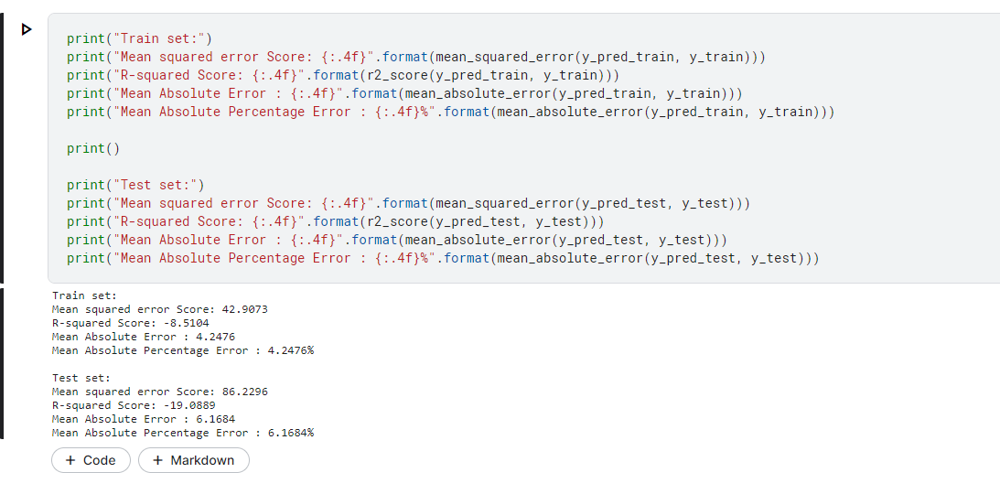

# **Daily climate time series data**

In [24]:
data = pd.read_csv("/kaggle/input/daily-climate-time-series-data/DailyDelhiClimateTrain.csv")
data.head()

,date,meantemp,humidity,wind_speed,meanpressure
0,2013-01-01,10.000000,84.500000,0.000000,1015.666667
1,2013-01-02,7.400000,92.000000,2.980000,1017.800000
2,2013-01-03,7.166667,87.000000,4.633333,1018.666667
3,2013-01-04,8.666667,71.333333,1.233333,1017.166667
4,2013-01-05,6.000000,86.833333,3.700000,1016.500000


In [25]:
profile = ProfileReport(data, title="Profiling Report")
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

# **Entry data visualizations**

In [26]:
data['date'] = pd.to_datetime(data['date'])


data['day'] = data['date'].dt.day
data['hour'] = data['date'].dt.hour
data['month'] = data['date'].dt.month

In [27]:
data.head()

,date,meantemp,humidity,wind_speed,meanpressure,day,hour,month
0,2013-01-01,10.000000,84.500000,0.000000,1015.666667,1,0,1
1,2013-01-02,7.400000,92.000000,2.980000,1017.800000,2,0,1
2,2013-01-03,7.166667,87.000000,4.633333,1018.666667,3,0,1
3,2013-01-04,8.666667,71.333333,1.233333,1017.166667,4,0,1
4,2013-01-05,6.000000,86.833333,3.700000,1016.500000,5,0,1


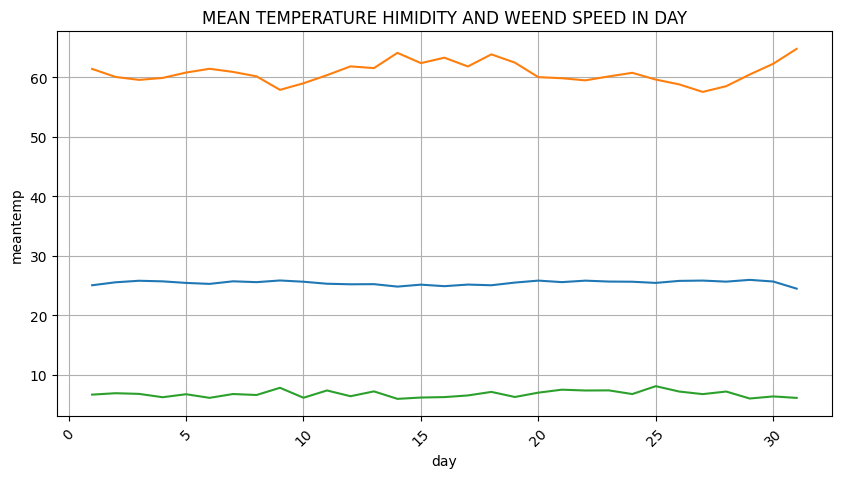

In [28]:
plt.figure(figsize=(10,5))
plt.title("MEAN TEMPERATURE HIMIDITY AND WEEND SPEED IN DAY")
sns.lineplot(data.groupby(by="day")['meantemp'].mean())
sns.lineplot(data.groupby(by="day")['humidity'].mean())
sns.lineplot(data.groupby(by="day")['wind_speed'].mean())
plt.xticks(rotation=45)
plt.grid()
plt.show()

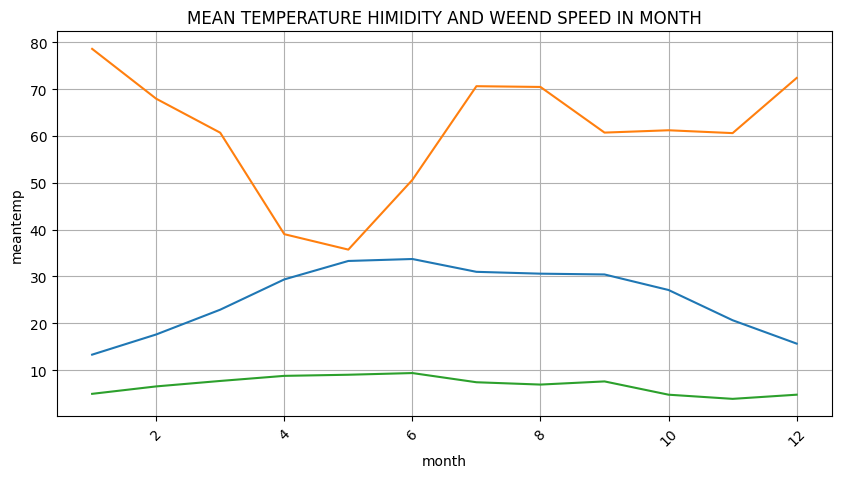

In [29]:
plt.figure(figsize=(10,5))
plt.title("MEAN TEMPERATURE HIMIDITY AND WEEND SPEED IN MONTH")
sns.lineplot(data.groupby(by="month")['meantemp'].mean())
sns.lineplot(data.groupby(by="month")['humidity'].mean())
sns.lineplot(data.groupby(by="month")['wind_speed'].mean())
plt.xticks(rotation=45)
plt.grid()
plt.show()

In [30]:
tempdata=data[['meantemp']]

tempdata.index=pd.to_datetime(data.date)

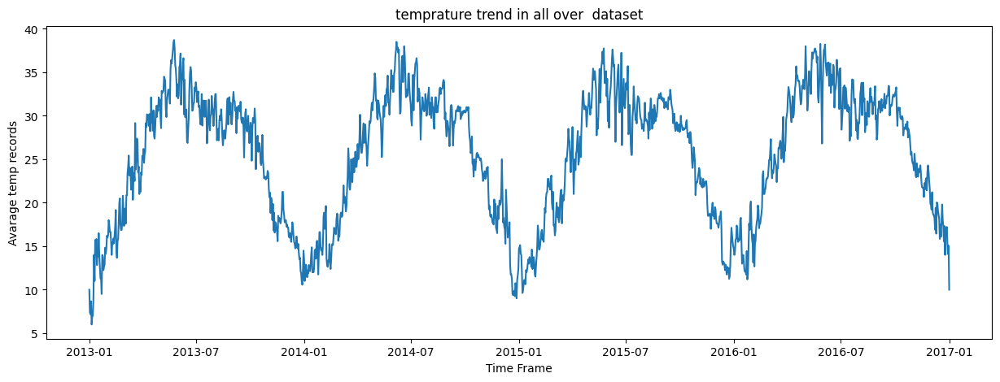

In [31]:
plt.figure(figsize=(15,5))
plt.xlabel("Time Frame")
plt.ylabel("Avarage temp records")
plt.title("temprature trend in all over  dataset")
plt.plot(tempdata)
plt.show()

# **Modeling**

In [32]:
x=data.drop(['meantemp','date'],axis=1)
y=data['meantemp']

In [33]:
x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.3)

# **SVR**

In [34]:
pipeline = Pipeline([
    ('scaler', StandardScaler()),
    ('svr', SVR())
])

param_grid = {
    'svr__kernel': ['linear', 'poly'],
    'svr__C': [0.1, 1, 10],
    'svr__epsilon': [0.1, 0.2, 0.5],
    'svr__degree': [2, 3, 4]  
}


In [35]:
grid_search = GridSearchCV(pipeline, param_grid, scoring='neg_mean_squared_error', cv=kf, n_jobs=-1)
grid_search.fit(x_train, y_train)

GridSearchCV(cv=KFold(n_splits=5, random_state=42, shuffle=True),
             estimator=Pipeline(steps=[('scaler', StandardScaler()),
                                       ('svr', SVR())]),
             n_jobs=-1,
             param_grid={'svr__C': [0.1, 1, 10], 'svr__degree': [2, 3, 4],
                         'svr__epsilon': [0.1, 0.2, 0.5],
                         'svr__kernel': ['linear', 'poly']},
             scoring='neg_mean_squared_error')

In [36]:
best_params = grid_search.best_params_
print("Best Hyperparameters:", grid_search.best_params_)
print("Best MSE:", -grid_search.best_score_)

Best Hyperparameters: {'svr__C': 1, 'svr__degree': 2, 'svr__epsilon': 0.1, 'svr__kernel': 'poly'}
Best MSE: 19.773060632439304


In [37]:
best_svr = SVR(kernel=best_params['svr__kernel'], C=best_params['svr__C'], epsilon=best_params['svr__epsilon'])
best_svr.fit(x_train, y_train)

SVR(C=1, kernel='poly')

In [38]:
y_pred_train = best_svr.predict(x_train)
y_pred_test = best_svr.predict(x_test)

In [39]:
print("Train set:")
print("Mean squared error Score: {:.4f}".format(mean_squared_error(y_pred_train, y_train)))
print("R-squared Score: {:.4f}".format(r2_score(y_pred_train, y_train)))
print("Mean Absolute Error : {:.4f}".format(mean_absolute_error(y_pred_train, y_train)))
print("Mean Absolute Percentage Error : {:.4f}%".format(mean_absolute_error(y_pred_train, y_train)))

print()

print("Test set:")
print("Mean squared error Score: {:.4f}".format(mean_squared_error(y_pred_test, y_test)))
print("R-squared Score: {:.4f}".format(r2_score(y_pred_test, y_test)))
print("Mean Absolute Error : {:.4f}".format(mean_absolute_error(y_pred_test, y_test)))
print("Mean Absolute Percentage Error : {:.4f}%".format(mean_absolute_error(y_pred_test, y_test)))

Train set:
Mean squared error Score: 49.5642
R-squared Score: -9.5213
Mean Absolute Error : 5.5324
Mean Absolute Percentage Error : 5.5324%

Test set:
Mean squared error Score: 329028.7917
R-squared Score: -0.0022
Mean Absolute Error : 32.9237
Mean Absolute Percentage Error : 32.9237%


# **Results of our model trained on less data**

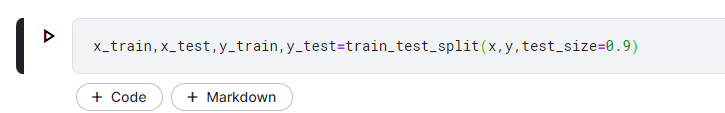

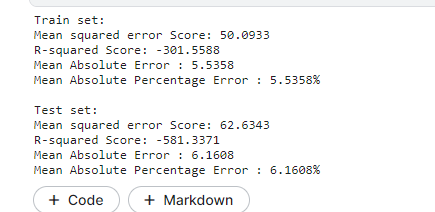

# **LinearSVR**

In [40]:
pipeline = Pipeline([
    ('scaler', StandardScaler()),
    ('svr', LinearSVR(max_iter = 10000))
])

param_grid = {
    'svr__C': [0.01, 0.1, 1.0, 10.0],  
    'svr__epsilon': [0.01, 0.1, 1.0], 
}

In [41]:
grid_search = GridSearchCV(pipeline, param_grid, scoring='neg_mean_squared_error', cv=kf, n_jobs=-1)
grid_search.fit(x_train, y_train)

GridSearchCV(cv=KFold(n_splits=5, random_state=42, shuffle=True),
             estimator=Pipeline(steps=[('scaler', StandardScaler()),
                                       ('svr', LinearSVR(max_iter=10000))]),
             n_jobs=-1,
             param_grid={'svr__C': [0.01, 0.1, 1.0, 10.0],
                         'svr__epsilon': [0.01, 0.1, 1.0]},
             scoring='neg_mean_squared_error')

In [42]:
best_params = grid_search.best_params_
print("Best Hyperparameters:", grid_search.best_params_)
print("Best MSE:", -grid_search.best_score_)

Best Hyperparameters: {'svr__C': 0.1, 'svr__epsilon': 1.0}
Best MSE: 124.29135097248252


In [43]:
best_svr_linear = SVR(C=best_params['svr__C'], epsilon=best_params['svr__epsilon'])
best_svr_linear.fit(x_train, y_train)

SVR(C=0.1, epsilon=1.0)

In [44]:
y_pred_train = best_svr_linear.predict(x_train)
y_pred_test = best_svr_linear.predict(x_test)

In [45]:
print("Train set:")
print("Mean squared error Score: {:.4f}".format(mean_squared_error(y_pred_train, y_train)))
print("R-squared Score: {:.4f}".format(r2_score(y_pred_train, y_train)))
print("Mean Absolute Error : {:.4f}".format(mean_absolute_error(y_pred_train, y_train)))
print("Mean Absolute Percentage Error : {:.4f}%".format(mean_absolute_error(y_pred_train, y_train)))

print()

print("Test set:")
print("Mean squared error Score: {:.4f}".format(mean_squared_error(y_pred_test, y_test)))
print("R-squared Score: {:.4f}".format(r2_score(y_pred_test, y_test)))
print("Mean Absolute Error : {:.4f}".format(mean_absolute_error(y_pred_test, y_test)))
print("Mean Absolute Percentage Error : {:.4f}%".format(mean_absolute_error(y_pred_test, y_test)))

Train set:
Mean squared error Score: 57.5025
R-squared Score: -27718.9666
Mean Absolute Error : 6.1637
Mean Absolute Percentage Error : 6.1637%

Test set:
Mean squared error Score: 56.6617
R-squared Score: -26910.1630
Mean Absolute Error : 6.2538
Mean Absolute Percentage Error : 6.2538%


# **Results of our model trained on less data**

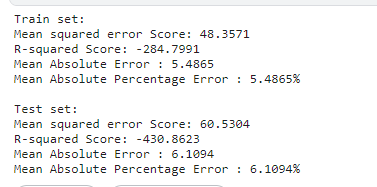